In [123]:
####CELL 1####

import os
import cv2
import numpy as np 
from matplotlib import pyplot as plt
import matplotlib.patches as patches
from sklearn.cluster import KMeans
from scipy.special import logsumexp
from sklearn.mixture import GaussianMixture #:(


In [6]:
# ## This is only to delete the images in SegmentedImages folder for testing purposes 
# segmentedConeFolderPath = '/Users/GilbertoE.Ruiz/IntelAutoSys/Project1/SegmentedConeImages'

# #This deletes every file in the folder
# filesToDelete = [os.path.join(segmentedConeFolderPath,file) for file in os.listdir(segmentedConeFolderPath)]
# for file_path in filesToDelete:
#     os.remove(file_path)

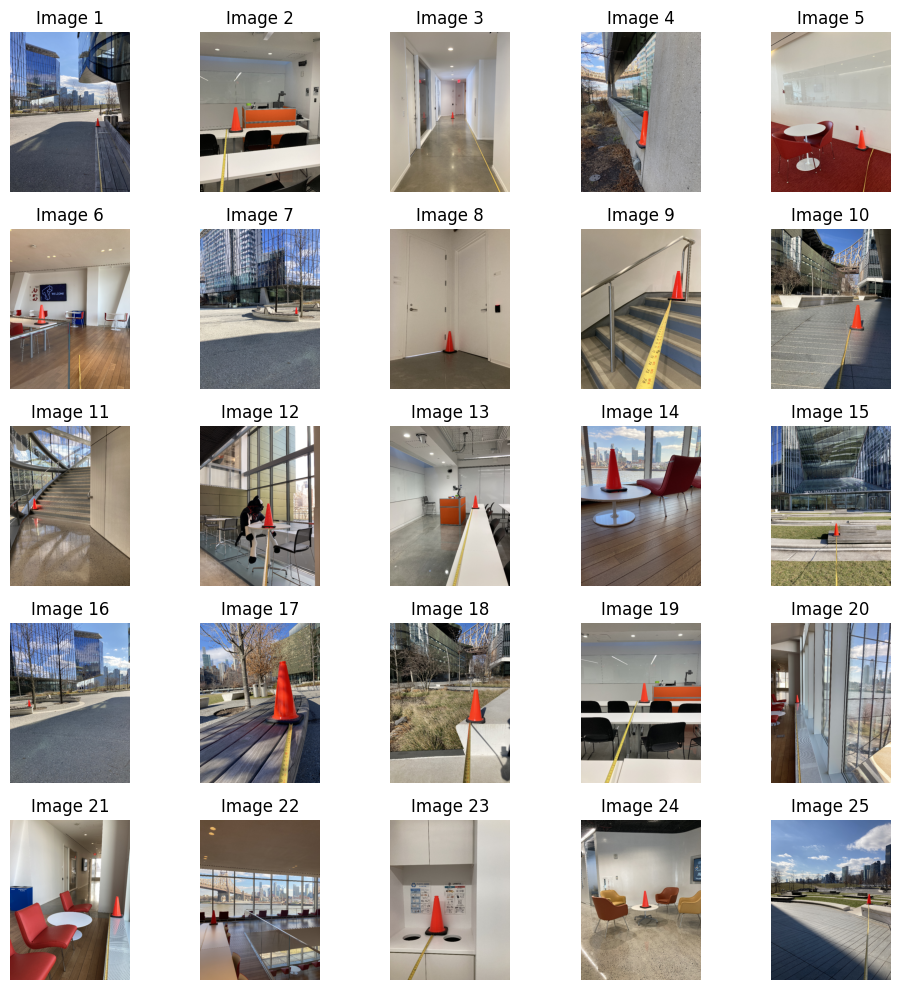

In [2]:
####CELL 2####

## The purpose of this cell is to show that I got access to the training images and plotted them all in order

#This is the path the training image folder called Proj1TrainImages 
#IMPORTANT: The path is different for everyone so if you want to test it then you'd need to change the path of the folder to what you have

##IMPORTANT TO CHANGE##
imageFolderPath = '/Users/GilbertoE.Ruiz/IntelAutoSys/Project1/Proj1TrainImages'
imageFolder = os.listdir(imageFolderPath)

fig, axes = plt.subplots(5, 5, figsize=(10, 10))
#for loop that goes through all 25 training images
for i in range(len(imageFolder)):

    #Gets specific image path
    imagePath = os.path.join(imageFolderPath, imageFolder[i])

    #Reads the image in folder
    image = cv2.imread(imagePath)

    #Converts image from BGR to RGB
    imageRGB = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    #Plotting all images on a subplot
    axes[i // 5, i % 5].imshow(imageRGB)
    axes[i // 5, i % 5].axis('off')
    axes[i // 5, i % 5].set_title(f'Image {i+1}')

plt.tight_layout()
plt.show()
    
    



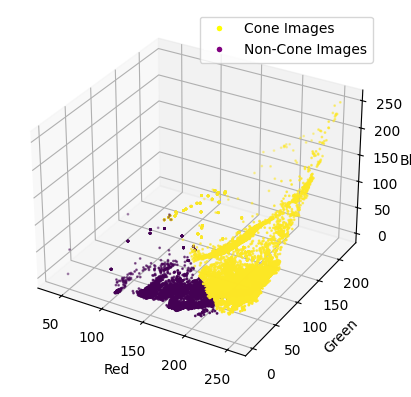

In [3]:
####CELL 3####

## This cell is to plot all images into a Color Space using the K-Mean Distribution method

def kmeans(data, k, max_iterations=100):
    #Starting centroids randomly
    centroids = data[np.random.choice(len(data), k, replace=False)]

    for _ in range(max_iterations):
        # This assigns the data points to the closest centroid in the color space
        labels = np.argmin(np.linalg.norm(data[:, np.newaxis] - centroids, axis=2), axis=1)

        # This updates the centroids depending on the mean of data points assigned to them
        centroids = np.array([data[labels == j].mean(axis=0) for j in range(k)])
    return centroids, labels

##IMPORTANT TO CHANGE##      
segmentedConeFolderPath = '/Users/GilbertoE.Ruiz/IntelAutoSys/Project1/SegmentedConeImages'
segmentedFolderPath = '/Users/GilbertoE.Ruiz/IntelAutoSys/Project1/SegmentedImages'


cone_pixels = []
noncone_pixels = []

#for loop that goes through all training images
for filename in os.listdir(segmentedConeFolderPath):

    #Gets specific image path of cone objects
    imagePath = os.path.join(segmentedConeFolderPath, filename)

    #Reads the image in folder
    imagefile = cv2.imread(imagePath)

    if imagefile is not None:

        #Converts images to RGB 
        imageRGB = cv2.cvtColor(imagefile, cv2.COLOR_BGR2RGB)

        #Flattens all the RGB values
        pixels = imageRGB.reshape((-1, 3))

        if pixels is not None:
            cone_pixels.append(pixels)

for filename in os.listdir(segmentedFolderPath):
     
    #Gets specific image path of nonCone objects
    imagePath2 = os.path.join(segmentedFolderPath, filename)

    #Reads the image in folder
    imagefile2 = cv2.imread(imagePath2)

    if imagefile2 is not None:

        #Converts images to RGB
        imageRGB2 = cv2.cvtColor(imagefile2, cv2.COLOR_BGR2RGB)

        #Flattens all the RGB values
        pixels2 = imageRGB.reshape((-1, 3))

        if pixels2 is not None:
            noncone_pixels.append(pixels2)

#Converting lists to numpy arrays 
cone_pixels = np.concatenate(cone_pixels, axis=0)
noncone_pixels = np.concatenate(noncone_pixels, axis=0)

#Number of clusters 
kCone = 2
kNonCone = 2

#Applying K-Means Clustering
centroids_cone, labels_cone = kmeans(cone_pixels, kCone)
centroids_noncone, labels_noncone = kmeans(noncone_pixels, kNonCone)

#Normalizing color
coneColors = labels_cone / kCone
nonconeColors = labels_noncone / kNonCone

#Plotting results
figure = plt.figure()
axis = figure.add_subplot(111, projection='3d')

#Scatter plot for cone images
cone_scatter = axis.scatter(cone_pixels[:, 0], cone_pixels[:, 1], cone_pixels[:, 2], c=coneColors, s=1, label='Cone Images')

#Scatter plot for nonCone images
noncone_scatter = axis.scatter(noncone_pixels[:, 0], noncone_pixels[:, 1], noncone_pixels[:, 2], c=nonconeColors, s=1, label='NonCone Images')

# Create custom legend with specified colors
custom_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='yellow', markersize=5),
                 plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='purple', markersize=5)]

axis.legend(custom_legend, ['Cone Images', 'Non-Cone Images'])

axis.set_xlabel('Red')
axis.set_ylabel('Green')
axis.set_zlabel('Blue')
plt.show()

   


Mean Probability for Cone Pixels: 6.781671239693162e-06
Standard Deviation of Probabilities for Cone Pixels: 3.479199538815969e-06
Minimum Probability for Cone Pixels: 1.2614696764508288e-39
Maximum Probability for Cone Pixels: 1.9382760903103073e-05


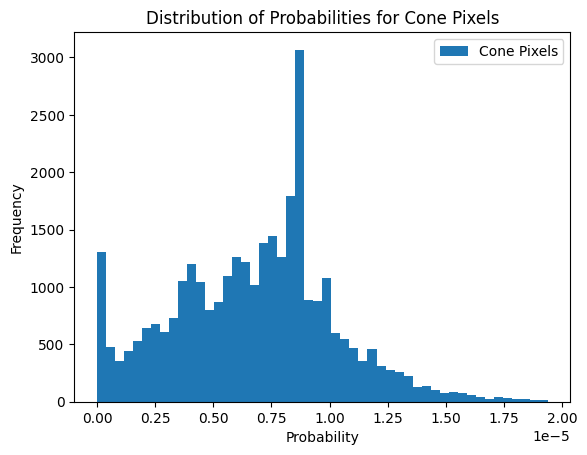

In [37]:
####FOR DEBUGGING####

# #The purpose of this cell is to quantify the distribution of probabilities get the appropriate threshold 
# cone_means, cone_covariances, cone_weights, cone_labels, cone_gmm_model = gmm(cone_pixels, kCone)
# log_likelihoods_cone = cone_gmm_model.score_samples(cone_pixels.reshape(-1, 3))
# probabilities_cone = np.exp(log_likelihoods_cone)

# # Print statistics for the distribution of probabilities for cone pixels
# print(f"Mean Probability for Cone Pixels: {np.mean(probabilities_cone)}")
# print(f"Standard Deviation of Probabilities for Cone Pixels: {np.std(probabilities_cone)}")
# print(f"Minimum Probability for Cone Pixels: {np.min(probabilities_cone)}")
# print(f"Maximum Probability for Cone Pixels: {np.max(probabilities_cone)}")

# # Plot the histogram of probabilities for cone pixels
# plt.hist(probabilities_cone, bins=50, label='Cone Pixels')
# plt.title('Distribution of Probabilities for Cone Pixels')
# plt.xlabel('Probability')
# plt.ylabel('Frequency')
# plt.legend()
# plt.show()

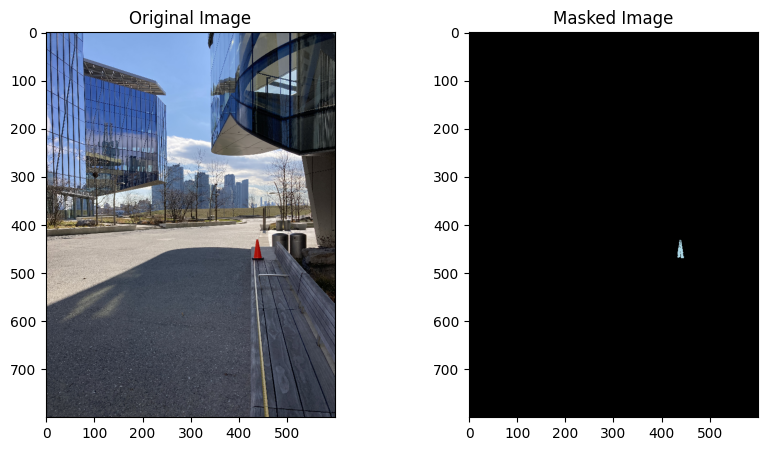

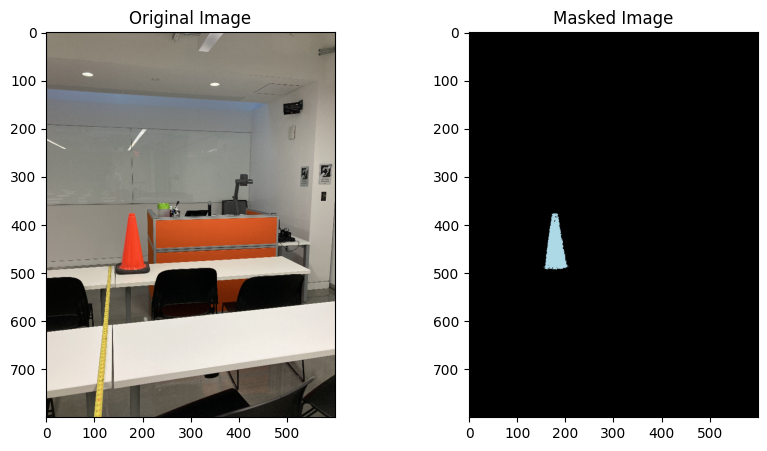

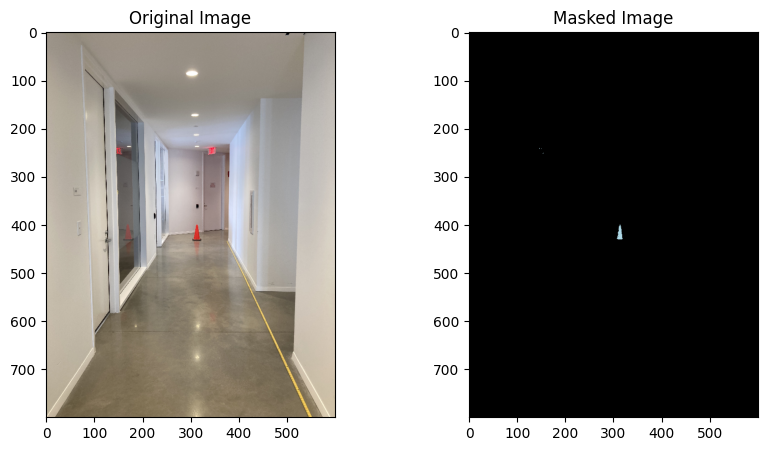

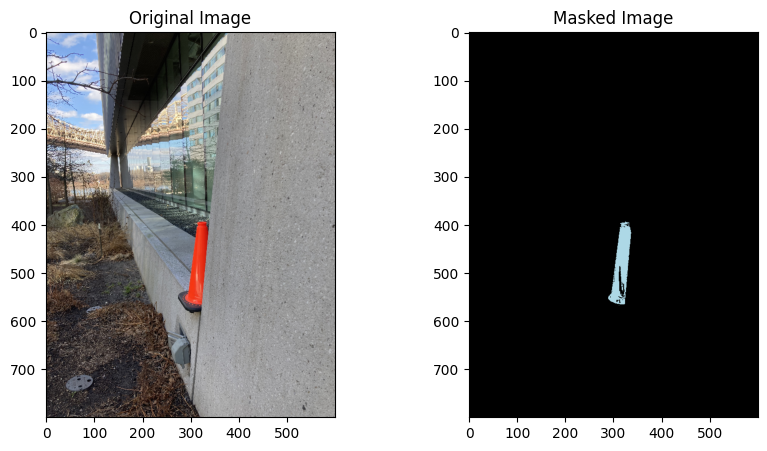

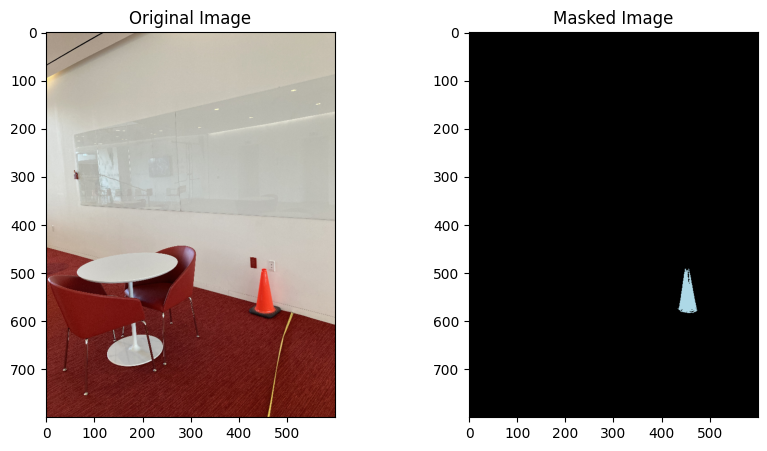

In [135]:
####CELL 4####

#This cell is to calculate the mean, covariance, weights, labels and identify if the image pixel is a cone, but using the built in GMM library 
#It has also been optimized to run very fast using numpy vectorization 
def gmm(data, k, max_iterations=100):
    gmm_model = GaussianMixture(n_components=k, max_iter=max_iterations)
    gmm_model.fit(data)
    return gmm_model

def is_cone(pixel_rgb, gmm_model, threshold):
    pixel_rgb = np.array(pixel_rgb).reshape(1, -1)
    log_likelihood = gmm_model.score_samples(pixel_rgb)
    probability = np.exp(log_likelihood)
    return probability > threshold 

def classify_image(image, gmm_model, threshold):
    height, width, _ = image.shape
    pixels = image.reshape(-1, 3)
    probabilities = np.exp(gmm_model.score_samples(pixels))
    cone_mask = probabilities > threshold
    result_image = np.zeros((height * width, 3), dtype=np.uint8)
    result_image[cone_mask] = [173, 216, 230] #light blue
    result_image = result_image.reshape((height, width, 3))
    return result_image

#Example Usage
##IMPORTANT TO CHANGE##
segmentedConeFolderPath = '/Users/GilbertoE.Ruiz/IntelAutoSys/Project1/SegmentedConeImages'
cone_pixels = []

for filename in os.listdir(segmentedConeFolderPath):
    imagePath = os.path.join(segmentedConeFolderPath, filename)
    imagefile = cv2.imread(imagePath)

    if imagefile is not None:
        imageRGB = cv2.cvtColor(imagefile, cv2.COLOR_BGR2RGB)
        pixels = imageRGB.reshape((-1, 3))
        if pixels is not None:
            cone_pixels.append(pixels)

cone_pixels = np.concatenate(cone_pixels, axis=0).reshape(-1, 3)
kCone = 2

cone_gmm_model = gmm(cone_pixels, kCone)
threshold = 2e-06

##IMPORTANT TO CHANGE##
test_image_folder = '/Users/GilbertoE.Ruiz/IntelAutoSys/Project1/Proj1TrainImages' #This path is meant to point at the original pictures
test_image_span = 5
for filename in os.listdir(test_image_folder)[:test_image_span]:
    test_image_path = os.path.join(test_image_folder, filename)
    test_image = cv2.imread(test_image_path)

    if test_image is not None:
        test_image_rgb = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
        result_image = classify_image(test_image_rgb, cone_gmm_model, threshold)


        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(test_image_rgb)
        plt.title('Original Image')

        plt.subplot(1, 2, 2)
        plt.imshow(result_image)
        plt.title('Masked Image')

        plt.show()



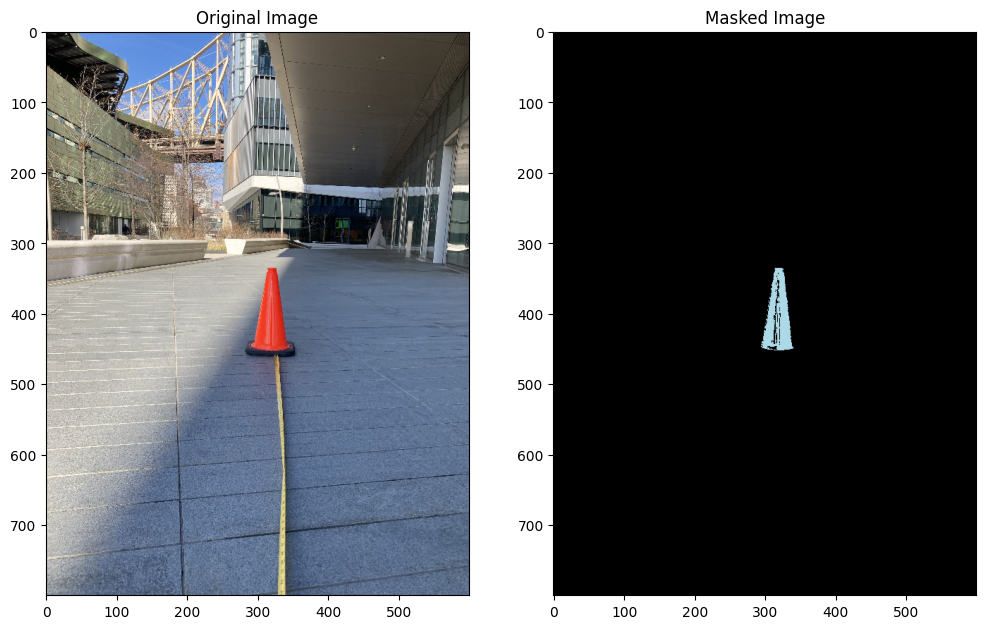

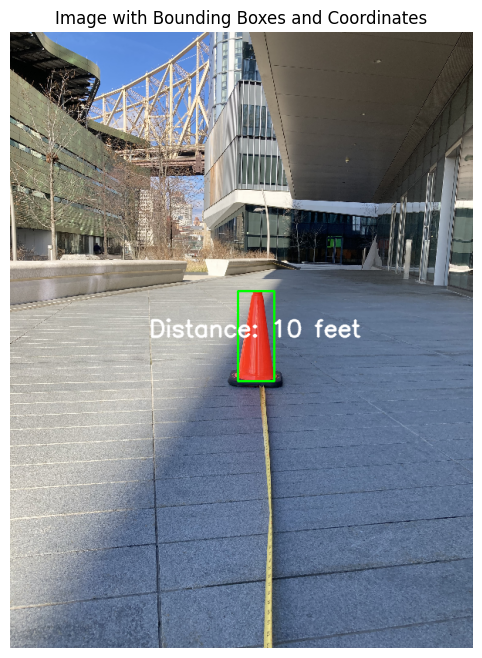

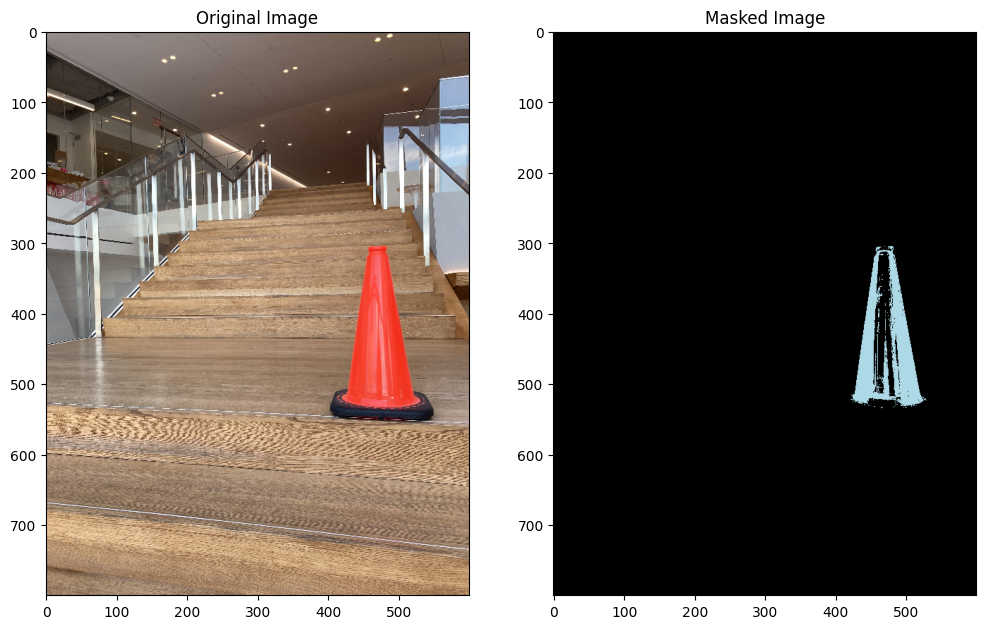

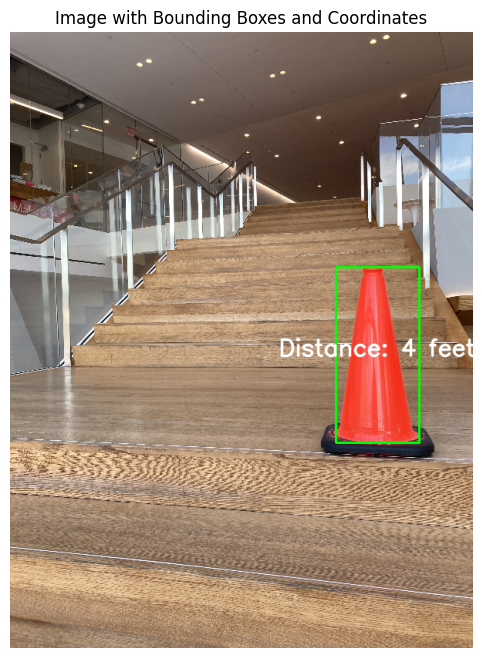

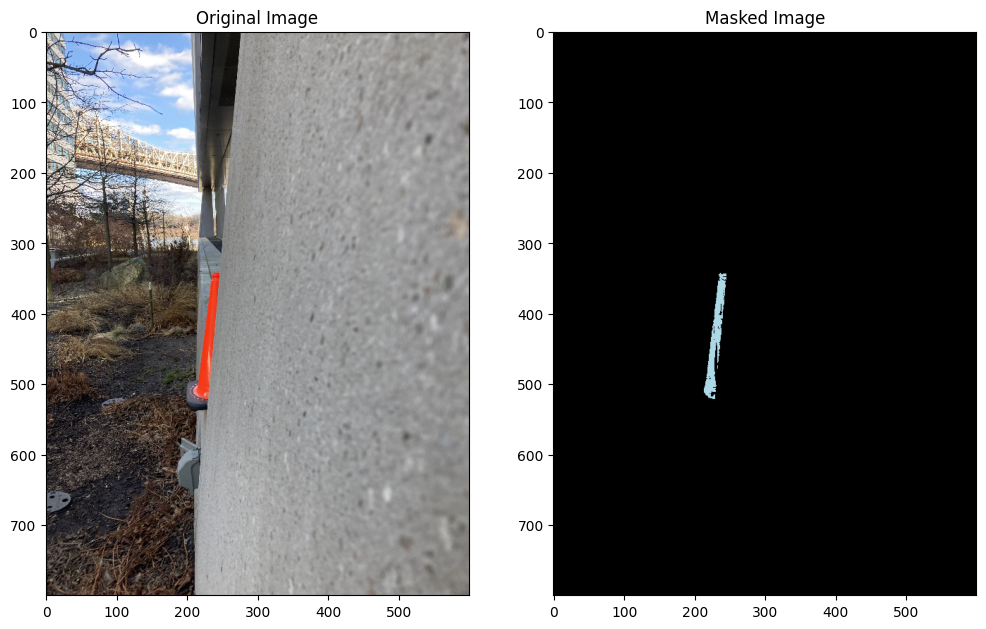

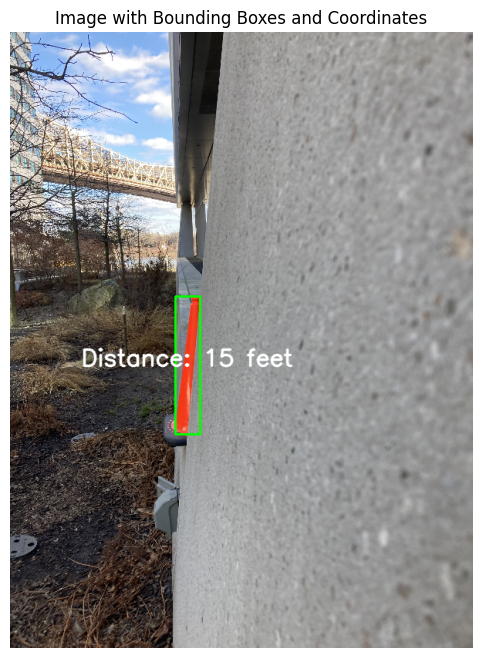

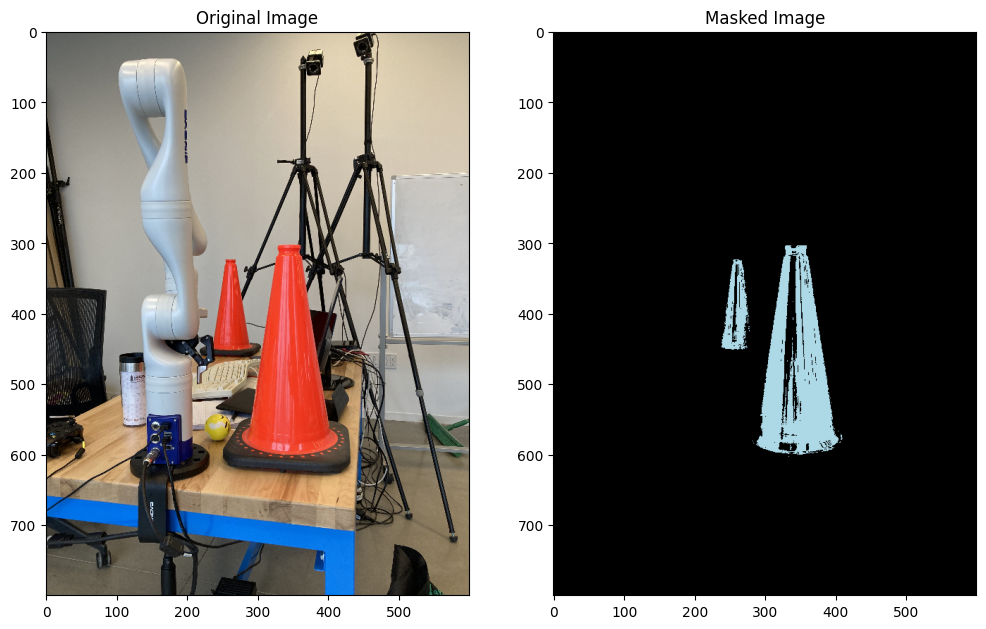

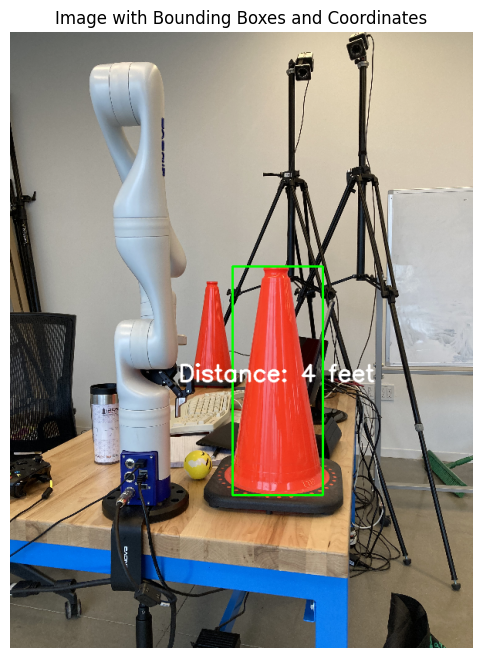

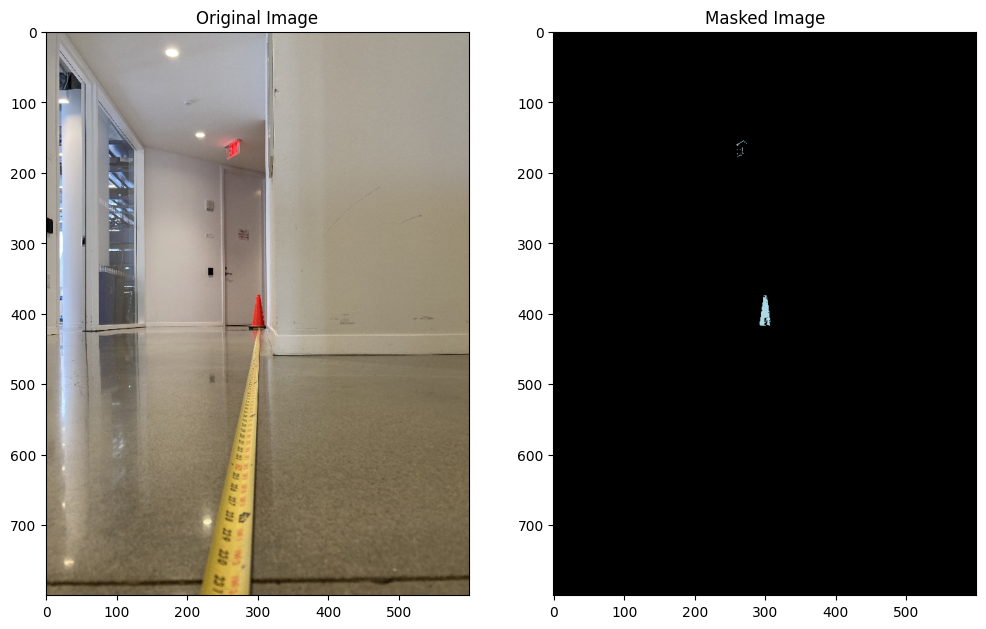

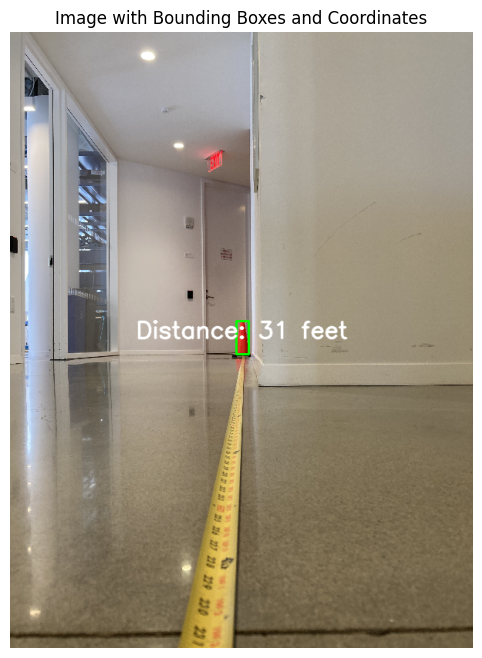

In [136]:
####CELL 5####

# This function adds bounding boxes around detected cones
def add_bounding_boxes_and_Coords(image, labels, stats, apparent_diameter_pixels):
    result_image = image.copy()

    sorted_labels = sorted(range(1, np.max(labels) + 1), key=lambda x: stats[x, cv2.CC_STAT_AREA], reverse=True)

    # range(1, np.max(labels) + 1)
    for label in sorted_labels:
        # Get the statistics of the current component
        left = stats[label, cv2.CC_STAT_LEFT]
        top = stats[label, cv2.CC_STAT_TOP]
        width = stats[label, cv2.CC_STAT_WIDTH]
        height = stats[label, cv2.CC_STAT_HEIGHT]

        # Draw bounding box
        cv2.rectangle(result_image, (left, top), (left + width, top + height), (0, 255, 0), 2)

        #Calculates the distance
        distance = (7.5 / width) * focal_length_pixels/ 12.0 
        font = cv2.FONT_HERSHEY_SIMPLEX

        # cv2.putText(result_image, f'Distance: {int(distance)} feet', (left, top - 10), font, 1.0, (255, 255, 255), 2, cv2.LINE_AA)
        text = f'Distance: {int(distance)} feet'
        text_size = cv2.getTextSize(text, font, 1.0, 2)[0]

        # Calculate the position to place the text in the middle
        text_x = (left + (width - text_size[0]) // 2)
        text_y = (top - 10) + (height + text_size[1]) // 2

        cv2.putText(result_image, text, (text_x, text_y), font, 1.0, (255, 255, 255), 2, cv2.LINE_AA)

        break

    return result_image

# Example Usage
test_image_folder = '/Users/GilbertoE.Ruiz/IntelAutoSys/Project1/ECE5242Proj1-test'
test_image_span = 5

for filename in os.listdir(test_image_folder)[:test_image_span]:
    test_image_path = os.path.join(test_image_folder, filename)
    test_image = cv2.imread(test_image_path)

    if test_image is not None:
        test_image_rgb = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
        result_image = classify_image(test_image_rgb, cone_gmm_model, threshold)

        # Start Particle Analysis
        num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(result_image[:, :, 0])

        apparent_diameter_pixels = stats[:, cv2.CC_STAT_WIDTH]
        focal_length_pixels = 800
        

        result_image_with_boxes = add_bounding_boxes_and_Coords(test_image_rgb, labels, stats, apparent_diameter_pixels)

        plt.figure(figsize=(12, 8))
        plt.subplot(1, 2, 1)
        plt.imshow(test_image_rgb)
        plt.title('Original Image')

        plt.subplot(1, 2, 2)
        plt.imshow(result_image)
        plt.title('Masked Image')

        plt.show()

        # Create a new figure for the image with bounding boxes
        plt.figure(figsize=(12, 8))

        # Image with Bounding Boxes
        result_image_with_boxes = add_bounding_boxes_and_Coords(test_image_rgb, labels, stats, apparent_diameter_pixels)
        plt.imshow(result_image_with_boxes)
        plt.title('Image with Bounding Boxes and Coordinates')
        plt.axis('off')  # Turn off axis labels for cleaner display

        # Display the plot
        plt.show()


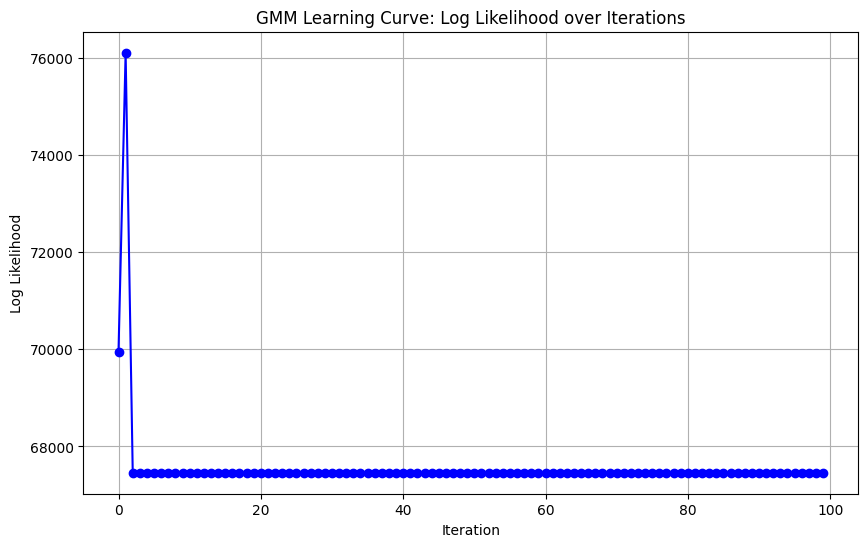

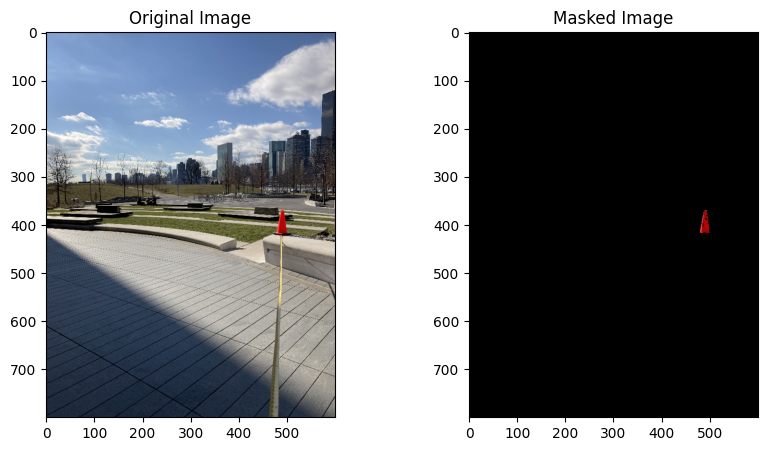

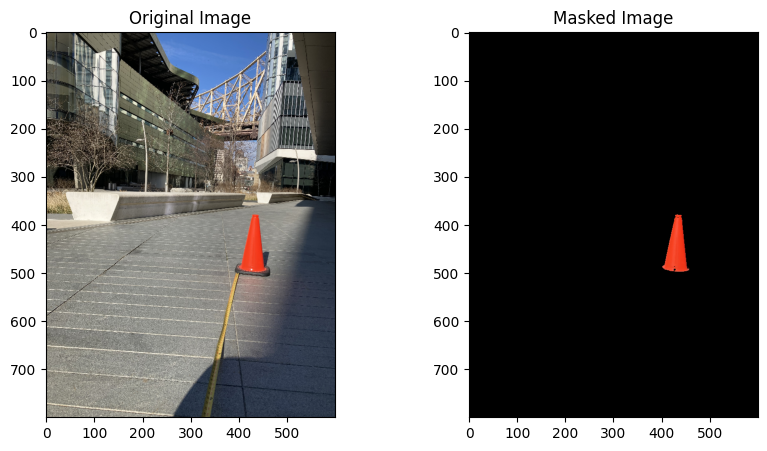

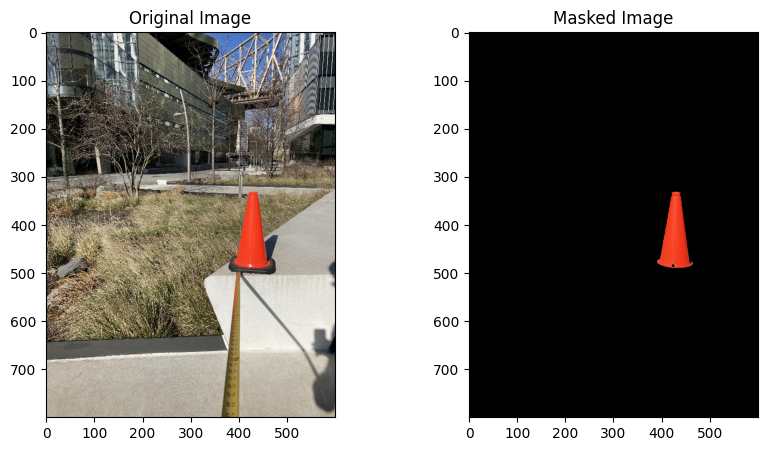

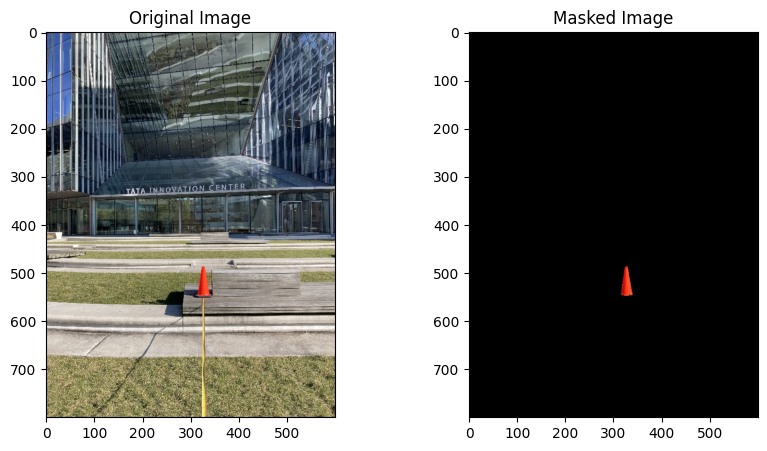

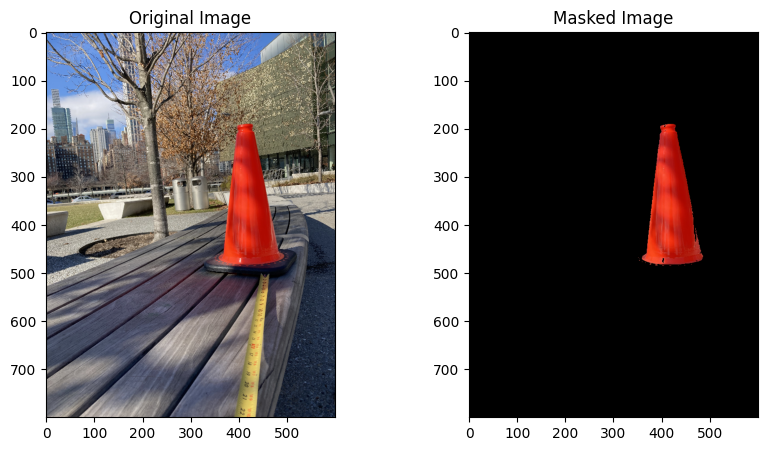

In [160]:
####REVISITED CELL 4####

#This cell is to revisit applying a GMM model without using the built in Gaussian Mixture library

#This function is to convert the images to a HSV color space
def convert_to_hsv(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

#Making a GMM class
class GMM: 
    #Initializing the numbers of components and max iterations for the code
    def __init__ (self, n_components, max_iterations=100):
        self.n_components = n_components
        self.max_iterations = max_iterations
        self.log_likelihoods = []

    #Method to put the GMM model to the data obtained 
    def fit(self, data):

        self.data =  data
        self.n_samples, self.n_features = self.data.shape
  
        #Start the process of getting the means by using the KMeans algorithm
        self.means = kmeans_init(self.data, self.n_components)
        #Organizes the weights uniformly 
        self.weights = np.ones(self.n_components) / self.n_components
        #Organizes the covariances based on the data
        self.covariances = np.array([np.cov(self.data.T) for _ in range(self.n_components)])

        #Updating the weights, means, and covariances using the E-M algorithm
        for _ in range(self.max_iterations):
            responsibilities = self._compute_responsibilities(self.data)
            self._update_parameters(self.data, responsibilities)

            current_log_likelihood = self._calculate_log_likelihood(data)
            self.log_likelihoods.append(current_log_likelihood)

    def _calculate_log_likelihood(self, data):
        log_likelihoods = self.score_samples(data)
        #Sum log likelihoods for all data points
        total_log_likelihood = np.sum(log_likelihoods)
        return total_log_likelihood

    #This method computes the responsibilities (E-step)
    def _compute_responsibilities(self, data):
        responsibilities = np.zeros((self.n_samples, self.n_components))
        #This computes the responsibilities for each component
        for i in range(self.n_components):
            responsibilities[:, i] = self.weights[i] * self._multivariate_normal_pdf(data, self.means[i], self.covariances[i])
        #Normalize responsibilities
        responsibilities_sum = responsibilities.sum(axis=1, keepdims=True)
        responsibilities /= responsibilities_sum

        return responsibilities
        
    #Method to update the parameters of the GMM (M-step)
    def _update_parameters(self, data, responsibilities):
        #Updating the weights
        self.weights = responsibilities.mean(axis=0)
        #Updating the means
        self.means = np.dot(responsibilities.T, data) / responsibilities.sum(axis=0)[:, np.newaxis]

        #Updating the covariances
        for i in range(self.n_components):
            diff = data - self.means[i]
            self.covariances[i] = np.dot(responsibilities[:, i] * diff.T, diff) / responsibilities[:, i].sum()


    #This method computes the multivariate normal PDF
    def _multivariate_normal_pdf(self, x, mean, covariance):
        det_cov = np.linalg.det(covariance)
        inv_cov = np.linalg.inv(covariance)
        exponent = -0.5 * np.sum(np.dot(x - mean, inv_cov) * (x - mean), axis=1)

        return (2 * np.pi) ** (-0.5 * self.n_features) * det_cov ** -0.5 * np.exp(exponent)
    
    #This method computes the log likelihood of samples
    def score_samples(self, data):

        log_likelihoods = np.zeros((data.shape[0], self.n_components))

        #Computing log likelihood for each component
        for i in range(self.n_components):
            mean = self.means[i]
            covariance = self.covariances[i]

            diff = data - mean
            precision = np.linalg.inv(covariance)
            log_det_cov = np.log(np.linalg.det(covariance) + 1e-6)
            log_weight = np.log(self.weights[i] + 1e-6)
            quadratic_term = np.sum((diff @ precision) * diff, axis=1)
           
            log_likelihoods[:, i] = -0.5 * (self.n_features * np.log(2 * np.pi) + log_det_cov + quadratic_term) + log_weight
        
        #Using the log-sum-exp to get the numerical stability
        max_log_likelihood = logsumexp(log_likelihoods, axis=1)

        return max_log_likelihood

    #This method predicts the component of the data based on the threshold to see if its a cone or not
    def predict(self, data, threshold):

        log_likelihood = self.score_samples(data)
        probability = np.exp(log_likelihood)

        return probability > threshold
    
#This function organizes the means using KMeans clustering
def kmeans_init(data, n_clusters):

    kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(data)

    return kmeans.cluster_centers_

#This function classifies the images using the GMM model thats been fitted with the data  
def classify_image(image, gmm_model, threshold):
    
    imageHSV = convert_to_hsv(image)
    height, width, _ = imageHSV.shape
    pixels = imageHSV.reshape(-1, 3) / 255.0

    probabilities = gmm_model.predict(pixels, threshold)
    cone_mask = probabilities.reshape(height, width)

    #Filtering the masked image
    filtered_mask = cone_mask.astype(np.uint8)

    result_image = image.copy()
    result_image[filtered_mask == 0] = 0

    return result_image

#This is the function that starts the entire process of fitting the data to the GMM model 
def runGMM(segmentedConeFolderPath, n_components=2, max_iterations=100):
   
    cone_pixels = []
    for filename in os.listdir(segmentedConeFolderPath):
        imagePath = os.path.join(segmentedConeFolderPath, filename)
        imagefile = cv2.imread(imagePath)

        if imagefile is not None:
            imageHSV = convert_to_hsv(imagefile)
            pixels = imageHSV.reshape((-1, 3)) / 255.0
            cone_pixels.append(pixels)
    
    cone_pixels = np.concatenate(cone_pixels, axis=0).reshape(-1, 3)
    gmm_model = GMM(n_components=n_components, max_iterations=max_iterations)
    gmm_model.fit(cone_pixels)

    plt.figure(figsize=(10,6))
    plt.plot(gmm_model.log_likelihoods, marker='o', linestyle='-', color='b')
    plt.title('GMM Learning Curve: Log Likelihood over Iterations')
    plt.xlabel('Iteration')
    plt.ylabel('Log Likelihood')
    plt.grid(True)
    plt.show()

    return gmm_model


# Example Usage
##IMPORTANT TO CHANGE##
segmentedConeFolderPath = '/Users/GilbertoE.Ruiz/IntelAutoSys/Project1/SegmentedConeImages' #This is the path to the sample images of cone objects
cone_gmm_model = runGMM(segmentedConeFolderPath, n_components=2, max_iterations=100)

threshold = 0.5

##IMPORTANT TO CHANGE##
test_image_folder = '/Users/GilbertoE.Ruiz/IntelAutoSys/Project1/Proj1TrainImages' #This is the path to the test images
test_image_span = 5 #makes forloop run 5 times

for filename in sorted(os.listdir(test_image_folder))[:test_image_span]:
    test_image_path = os.path.join(test_image_folder, filename)
    test_image = cv2.imread(test_image_path)

    #This section prints out the original image and the masked image in a nice format to view the difference
    if test_image is not None:

        result_image = classify_image(test_image, cone_gmm_model, threshold)

        test_image_rgb = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
        result_image_rgb = cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(test_image_rgb)
        plt.title('Original Image')

        plt.subplot(1, 2, 2)
        plt.imshow(result_image_rgb)
        plt.title('Masked Image')

        plt.show()

ImageName:test_1.png, Down: 522.00, Right: 227.50, Distance: 13.51



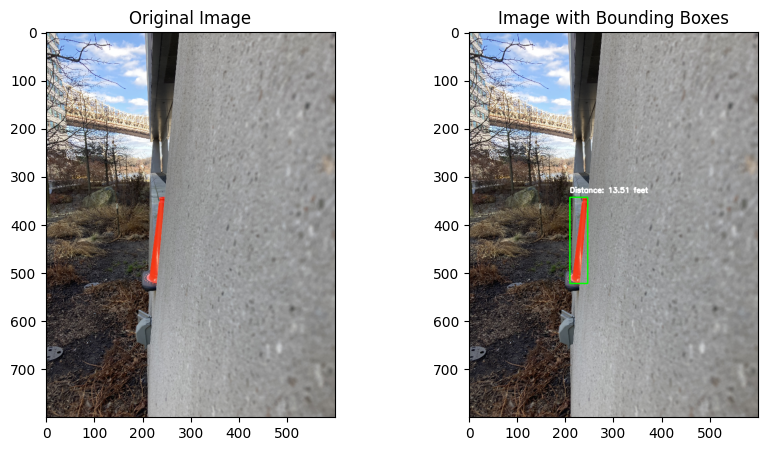

ImageName:test_2.png, Down: 536.00, Right: 475.00, Distance: 4.46



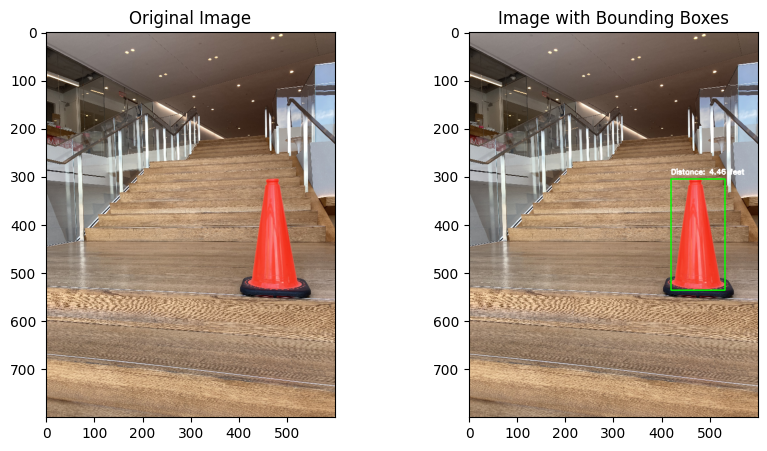

ImageName:test_3.png, Down: 453.00, Right: 319.50, Distance: 9.80



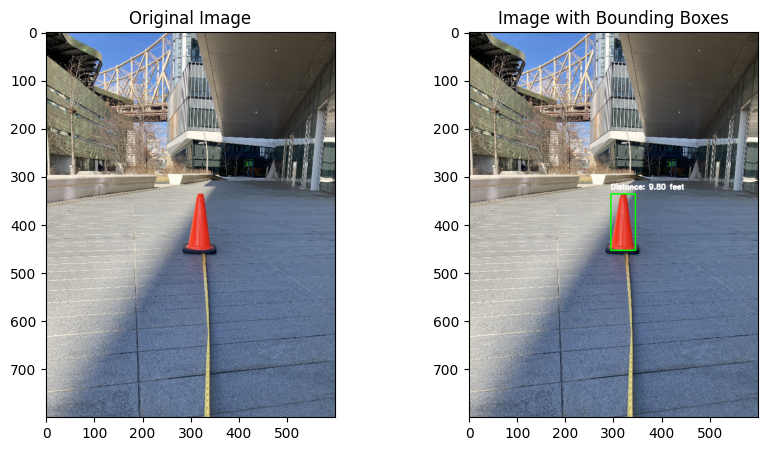

ImageName:test_4.png, Down: 419.00, Right: 300.50, Distance: 29.41



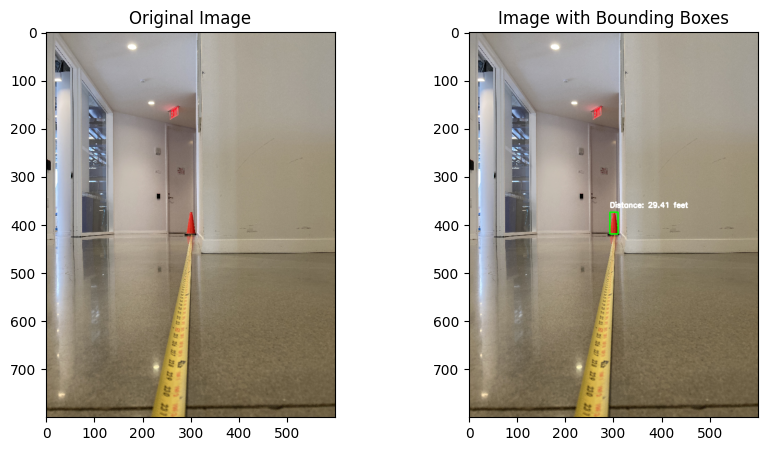

ImageName:test_5.png, Down: 601.00, Right: 346.00, Distance: 3.68

ImageName:test_5.png, Down: 452.00, Right: 263.00, Distance: 10.00



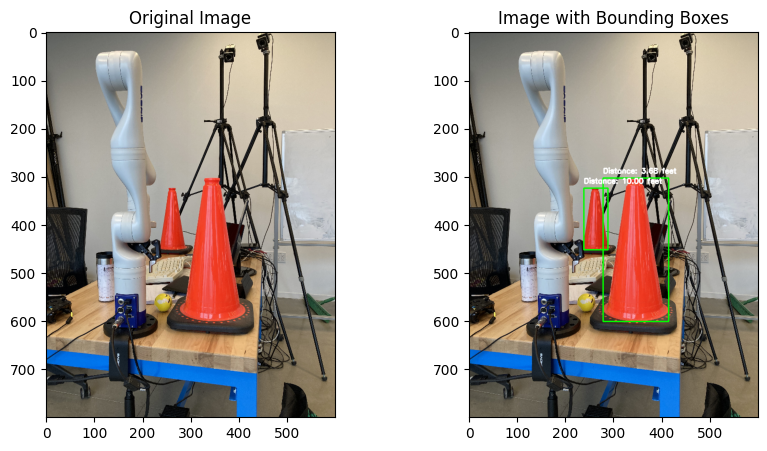

ImageName:train_10_dist20.png, Down: 418.00, Right: 490.00, Distance: 25.00



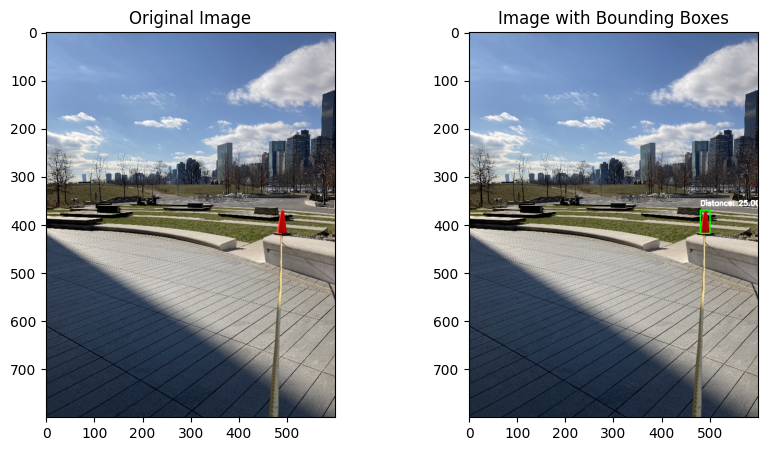

ImageName:train_12_dist8.png, Down: 498.00, Right: 429.00, Distance: 8.93



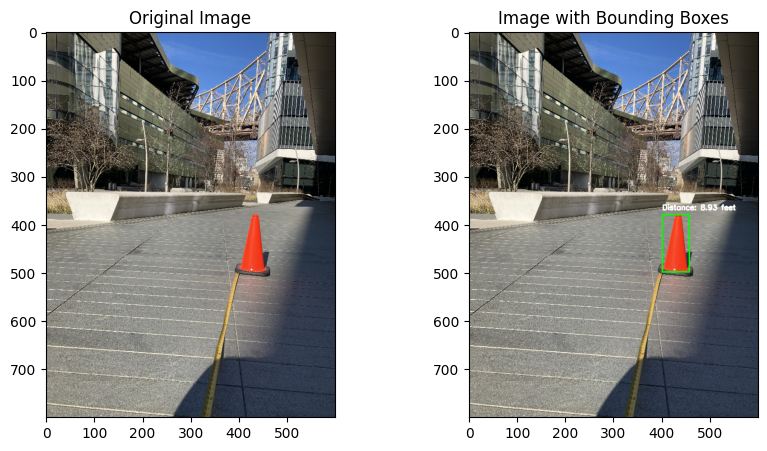

ImageName:train_13_dist6.png, Down: 491.00, Right: 427.50, Distance: 6.67



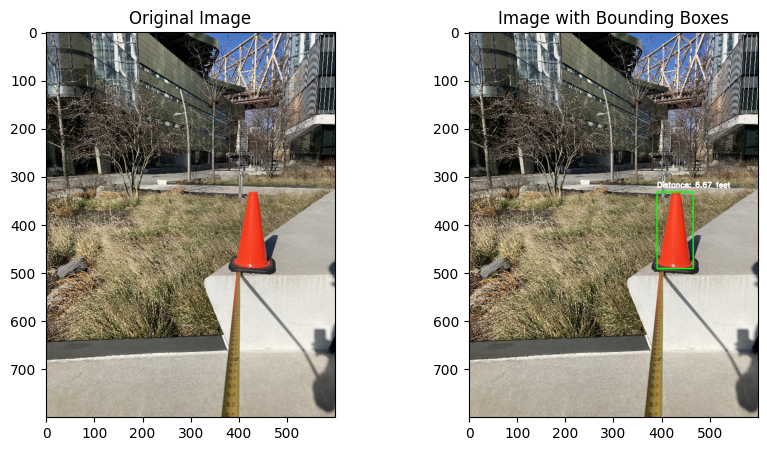

ImageName:train_14_dist16.png, Down: 548.00, Right: 327.50, Distance: 20.00



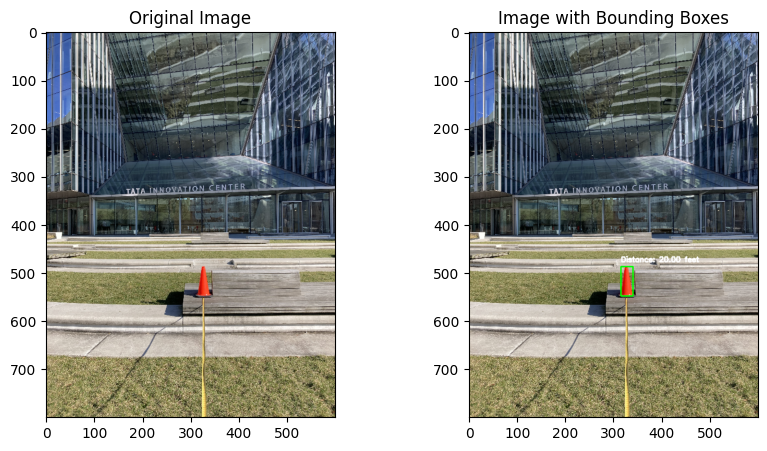

ImageName:train_15_dist3.png, Down: 483.00, Right: 422.50, Distance: 3.94



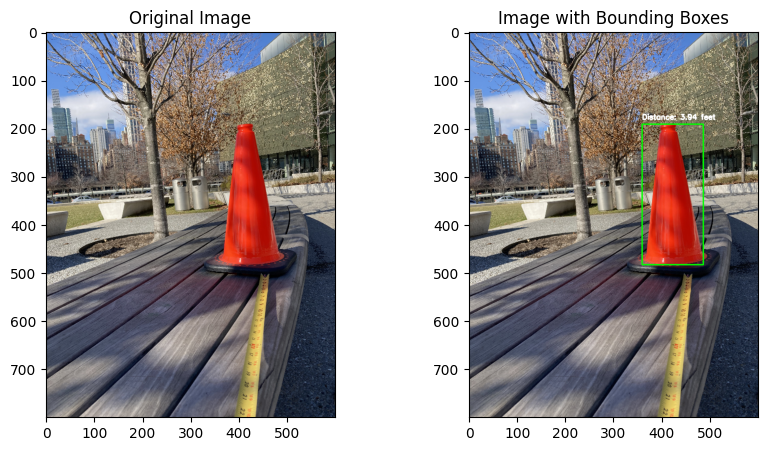

ImageName:train_16_dist24.png, Down: 470.00, Right: 439.50, Distance: 33.33



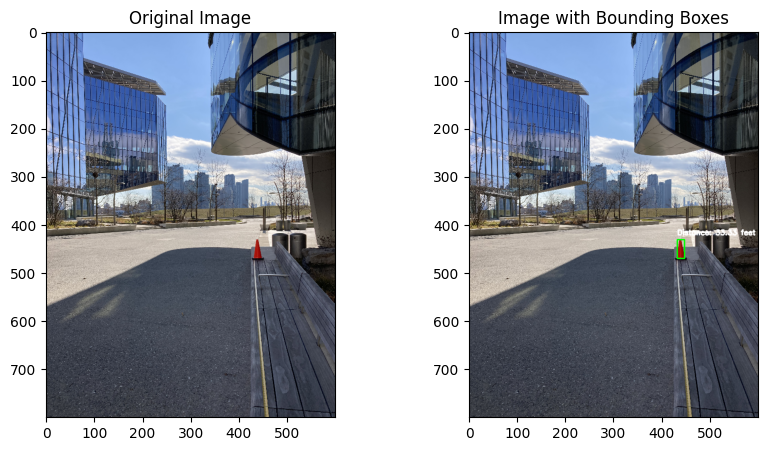

ImageName:train_17_dist8.png, Down: 500.00, Right: 342.50, Distance: 10.64



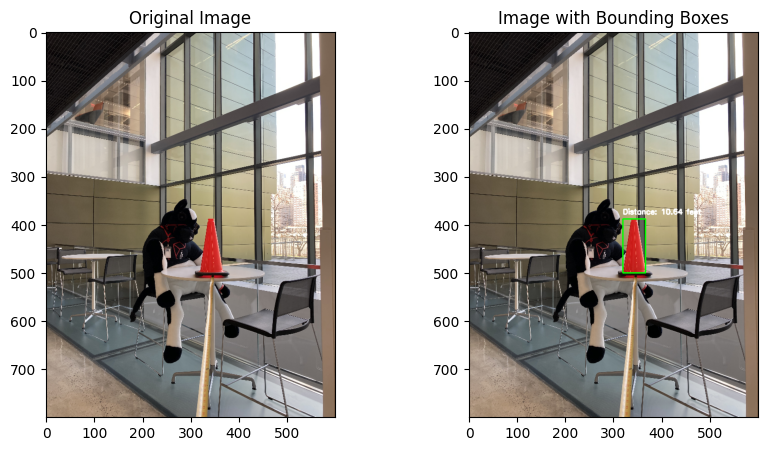

ImageName:train_18_dist5.png, Down: 562.00, Right: 234.00, Distance: 6.58



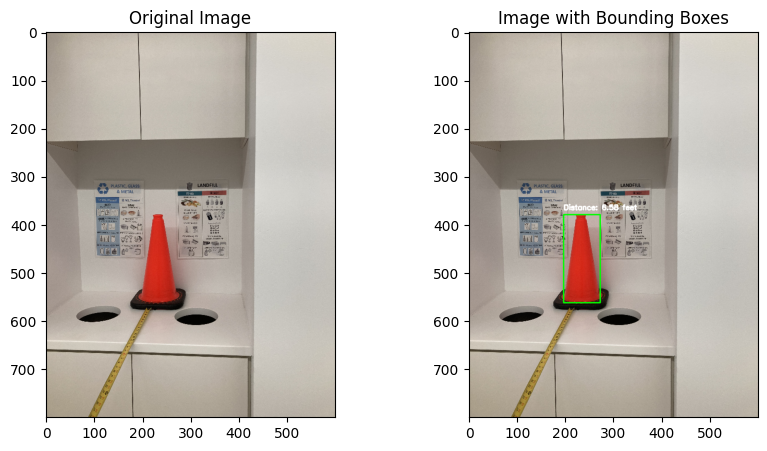

ImageName:train_19_dist15.png, Down: 411.00, Right: 427.00, Distance: 17.86



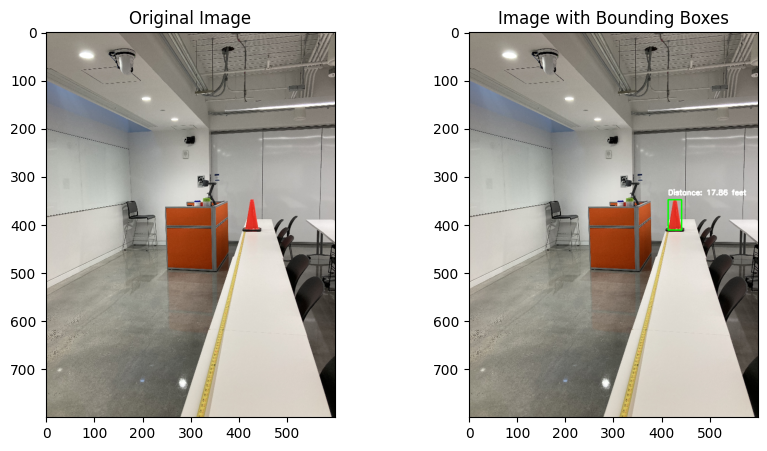

ImageName:train_1_dist30.png, Down: 431.00, Right: 313.00, Distance: 41.67



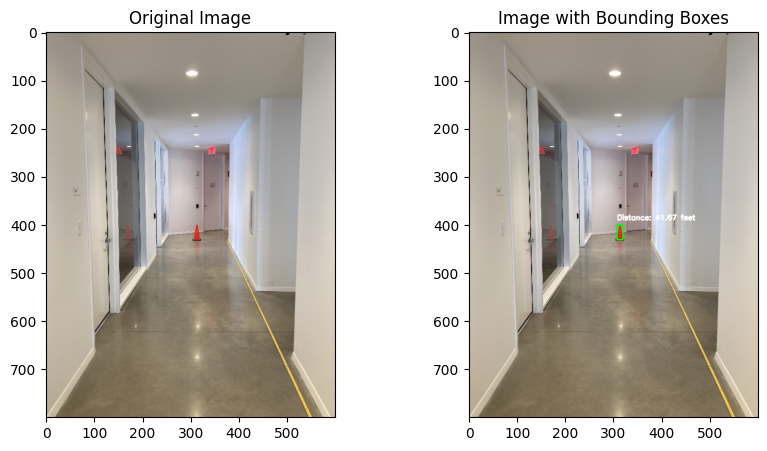

ImageName:train_20_dist8.png, Down: 495.00, Right: 180.00, Distance: 8.93



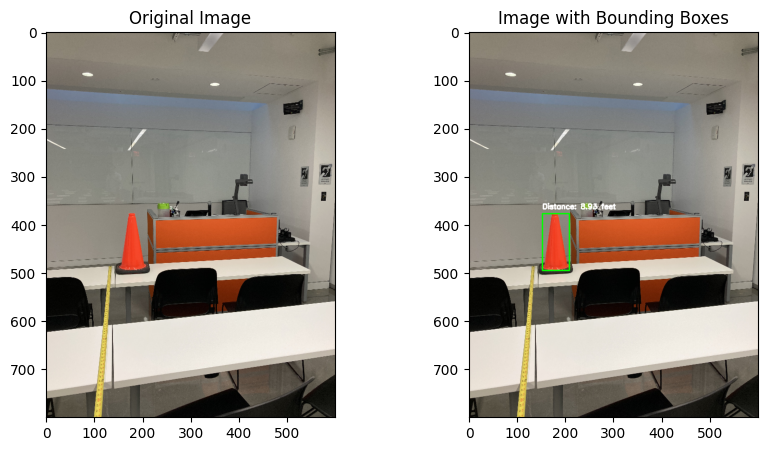

ImageName:train_21_dist10.png, Down: 394.00, Right: 317.50, Distance: 12.82



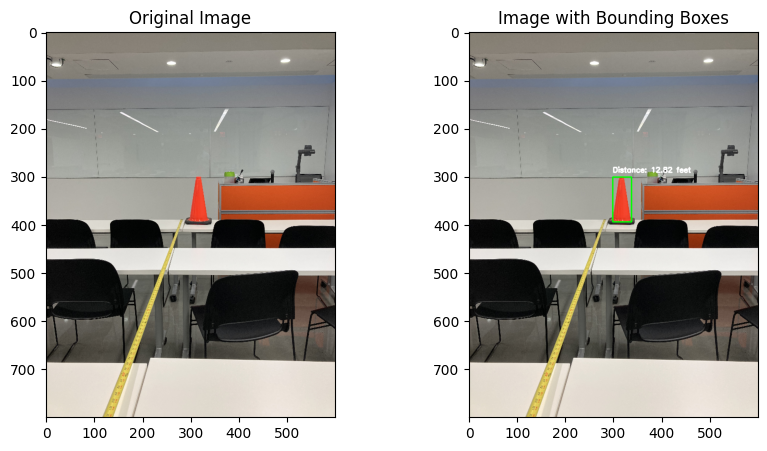

ImageName:train_22_dist7.png, Down: 349.00, Right: 481.50, Distance: 8.20



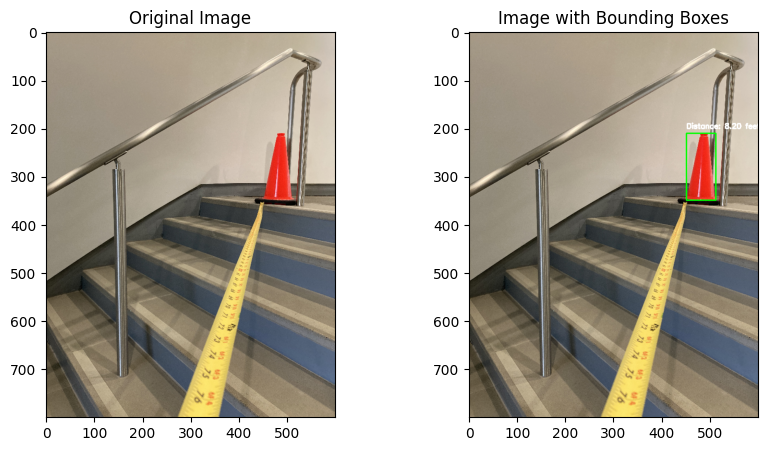

ImageName:train_24_dist12.png, Down: 435.00, Right: 323.00, Distance: 14.71



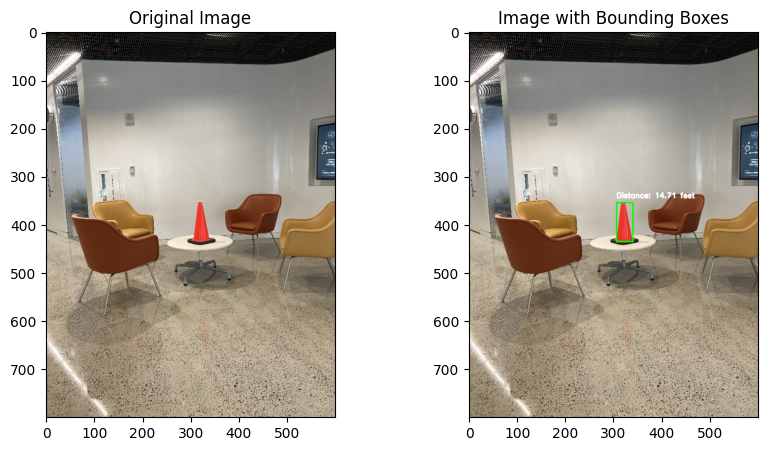

ImageName:train_25_dist19.png, Down: 416.00, Right: 125.00, Distance: 20.83

ImageName:train_25_dist19.png, Down: 406.00, Right: 143.50, Distance: 23.81



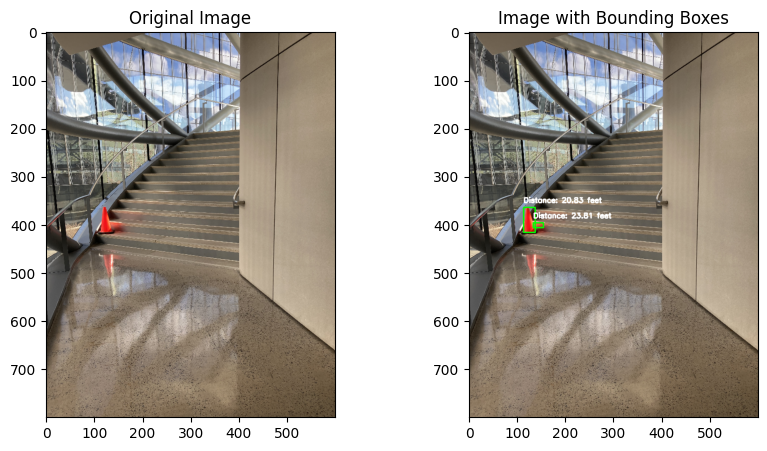

ImageName:train_26_dist30.png, Down: 424.00, Right: 481.50, Distance: 38.46



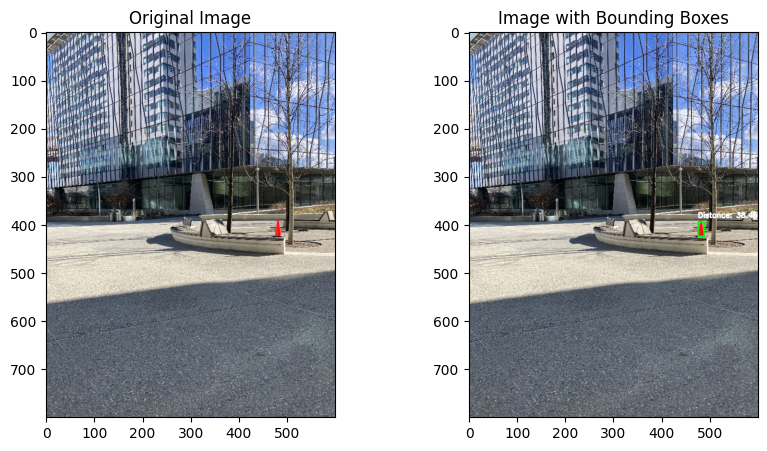

ImageName:train_27_dist30.png, Down: 417.00, Right: 97.50, Distance: 38.46



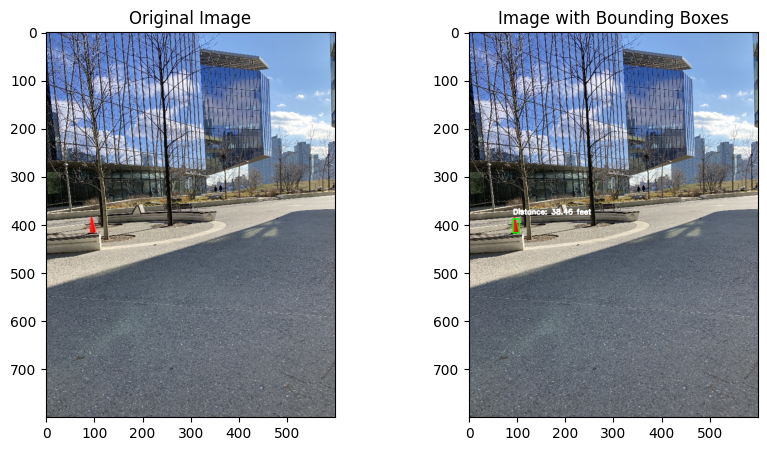

ImageName:train_29_dist5.png, Down: 566.00, Right: 313.00, Distance: 10.42



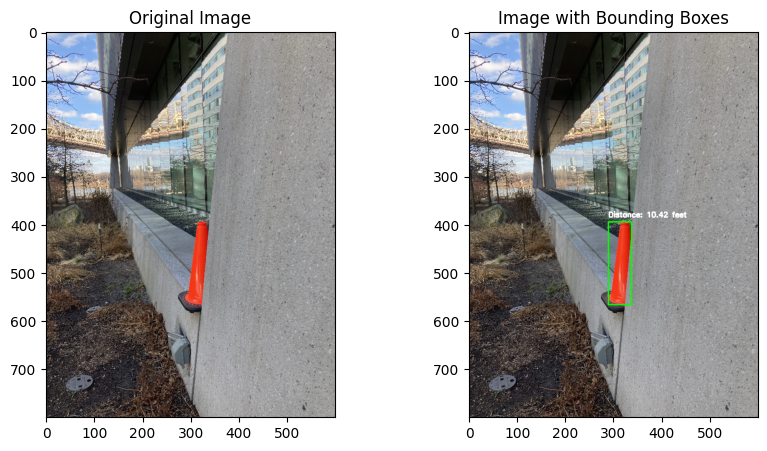

ImageName:train_2_dist10.png, Down: 449.00, Right: 163.50, Distance: 12.20

ImageName:train_2_dist10.png, Down: 447.00, Right: 360.50, Distance: 45.45

ImageName:train_2_dist10.png, Down: 472.00, Right: 157.50, Distance: 12.20



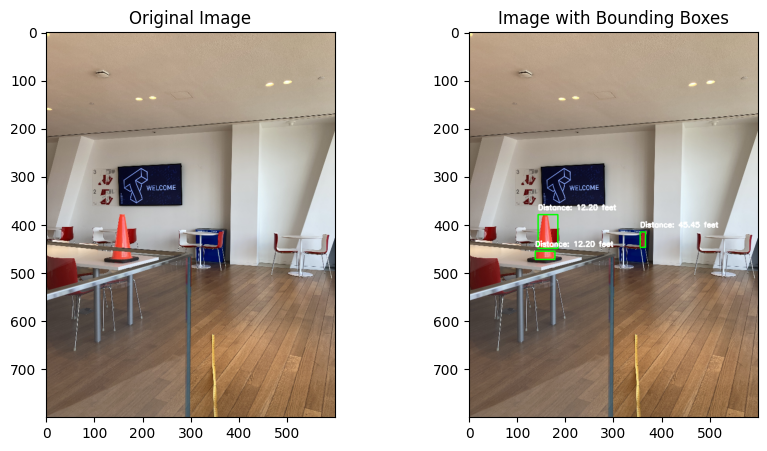

ImageName:train_31_dist10.png, Down: 612.00, Right: 298.00, Distance: 14.71



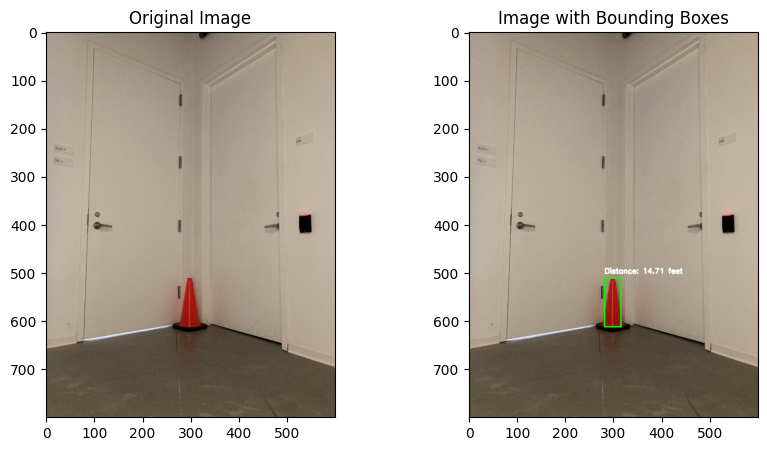

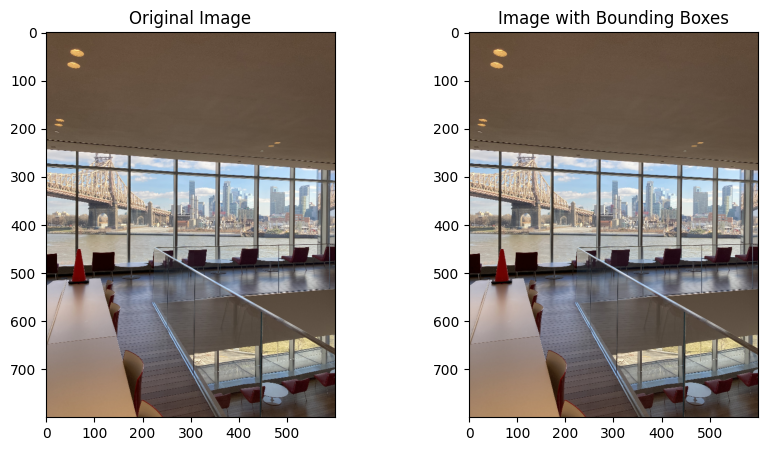

ImageName:train_4_dist5.png, Down: 316.00, Right: 165.00, Distance: 6.76



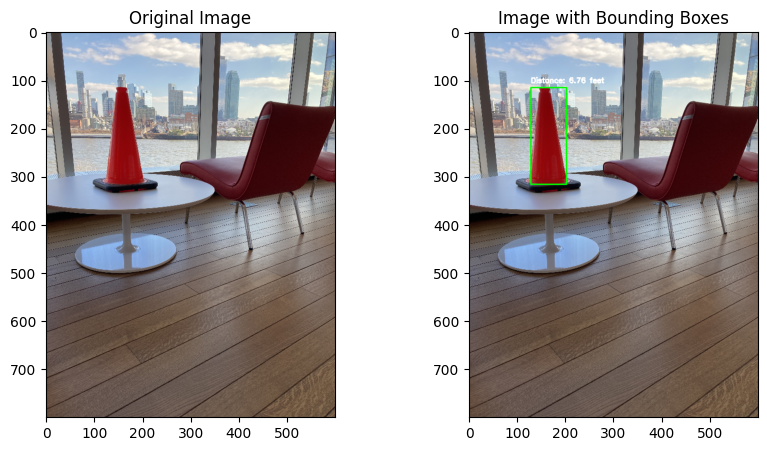

ImageName:train_5_dist25.png, Down: 398.00, Right: 133.50, Distance: 33.33



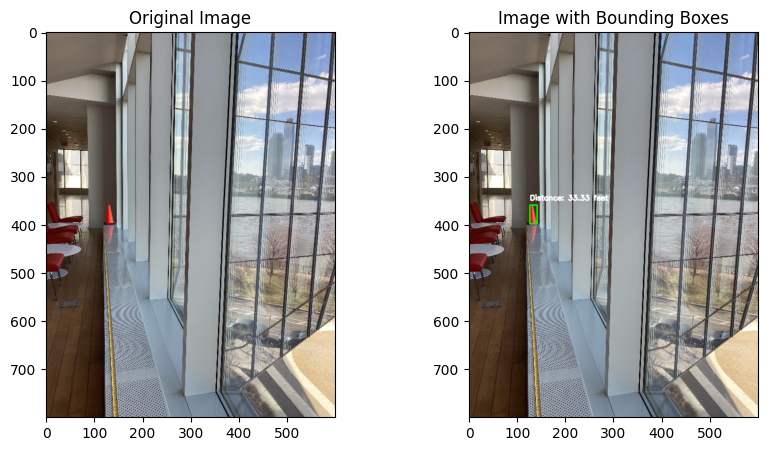

ImageName:train_6_dist10.png, Down: 452.00, Right: 279.50, Distance: 9.43

ImageName:train_6_dist10.png, Down: 481.00, Right: 534.00, Distance: 10.42

ImageName:train_6_dist10.png, Down: 617.00, Right: 109.00, Distance: 3.21

ImageName:train_6_dist10.png, Down: 640.00, Right: 268.50, Distance: 3.70

ImageName:train_6_dist10.png, Down: 679.00, Right: 13.50, Distance: 18.52

ImageName:train_6_dist10.png, Down: 800.00, Right: 155.00, Distance: 3.29



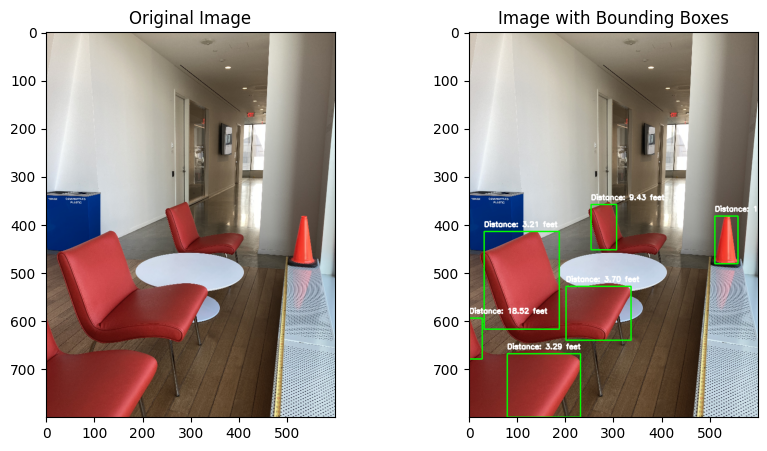

ImageName:train_7_dist10.png, Down: 585.00, Right: 455.00, Distance: 11.36



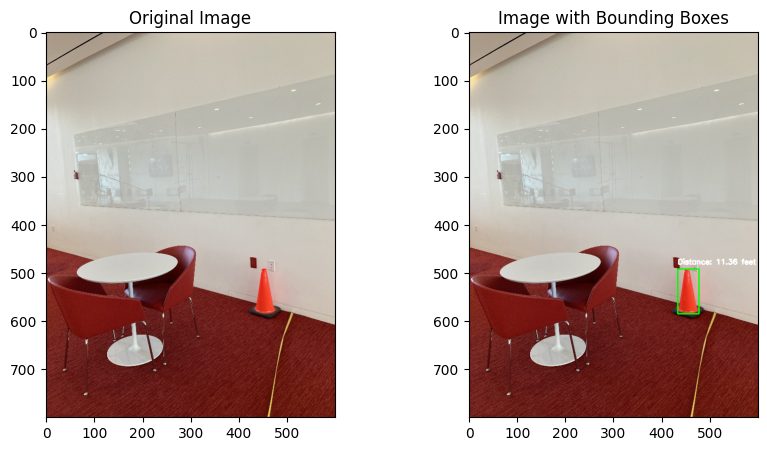

In [158]:
####REVISED CELL 5####
def add_bounding_boxes_and_Coords(image, mask, focal_length_pixels, filename, results_file_path):
    
    result_image = image.copy()
    bit_mask = (mask * 255).astype(np.uint8)
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(bit_mask, connectivity=8)
    

    for label in range(1, num_labels):
        left = stats[label, cv2.CC_STAT_LEFT]
        top = stats[label, cv2.CC_STAT_TOP]
        width = stats[label, cv2.CC_STAT_WIDTH]
        height = stats[label, cv2.CC_STAT_HEIGHT]
        area = stats[label, cv2.CC_STAT_AREA]

        if area < 100:
            continue
        
        #Draws a green cube on every object it detected as a cone
        cv2.rectangle(result_image, (left, top), (left + width, top + height), (0, 255, 0), 2)
        distance = (7.5 * focal_length_pixels) / width
        distance /= 12.0

        #Displays the distance in the image
        text = f'Distance: {distance:.2f} feet'
        font_scale = 0.5
        thickness = 2
        cv2.putText(result_image, text, (left, top - 10), cv2.FONT_HERSHEY_SIMPLEX, font_scale, (255, 255, 255), thickness)

        #Makes the calculations of the base and right side of the cone for the text file
        base_down = top + height
        base_right = left + width / 2

        #This is what writes out the distances in the text file
        result_text = f"ImageName:{filename}, Down: {base_down:.2f}, Right: {base_right:.2f}, Distance: {distance:.2f}\n"
        print(result_text)
        with open(results_file_path, 'a') as f:
            f.write(result_text)

    return result_image

#This opens the text file to print out the distances 
results_file_path = '/Users/GilbertoE.Ruiz/IntelAutoSys/Project1/results.txt'
with open(results_file_path, 'w') as f:
    f.close()

#This part of the code bounds the test images in boxes and displays the real world distance of the cone 
focal_length_pixels = 800
test_image_folder = '/Users/GilbertoE.Ruiz/IntelAutoSys/Project1/ECE5242Proj1-test'
test_image_span = 5


#This is the part that runs all of the test images through the bounding box code
for filename in sorted(os.listdir(test_image_folder))[:test_image_span]:
    test_image_path = os.path.join(test_image_folder, filename)
    test_image = cv2.imread(test_image_path)

    if test_image is not None:
        classified_mask = classify_image(test_image, cone_gmm_model, threshold)
        mask = (classified_mask[:, :, 0] > 0).astype(np.uint8) * 255

        result_image_bounded = add_bounding_boxes_and_Coords(test_image, mask, focal_length_pixels, filename, results_file_path)

        #plots the original image and the bounded box image together to view easier
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB))
        plt.title('Original Image')

        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(result_image_bounded, cv2.COLOR_BGR2RGB))
        plt.title('Image with Bounding Boxes')

        plt.show()

#This part just retests the bounding box code but with all the original 25 images of the dataset
test_image_folder2 = '/Users/GilbertoE.Ruiz/IntelAutoSys/Project1/Proj1TrainImages'
test_image_span2 = 25

for filename in sorted(os.listdir(test_image_folder2))[:test_image_span2]:
    test_image_path = os.path.join(test_image_folder2, filename)
    test_image = cv2.imread(test_image_path)

    if test_image is not None:
        classified_mask = classify_image(test_image, cone_gmm_model, threshold)
        mask = (classified_mask[:, :, 0] > 0).astype(np.uint8) * 255

        result_image_bounded = add_bounding_boxes_and_Coords(test_image, mask, focal_length_pixels, filename, results_file_path)

        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB))
        plt.title('Original Image')

        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(result_image_bounded, cv2.COLOR_BGR2RGB))
        plt.title('Image with Bounding Boxes')

        plt.show()
